# colab_08 — Integration of balanced 100k + 100k subsamples

Integrates **Bhaduri 2020 organoids (100k)** and **Bhaduri 2021 fetal cortex (100k)** into a shared embedding using Harmony batch correction.

Replaces colab_03, which integrated Bhaduri 2020 (224k) + Zhong 2018 (2,330) at a 100× imbalance. The downstream DPT pathology in Session 15 traced back to that imbalance plus disconnected graph components from rare Zhong-only cell types (microglia, OPCs, RBC). Sessions 16–20 replaced Zhong with Bhaduri 2021 and stratified-subsampled both datasets to 100k.

## Inputs
- `data/processed/bhaduri_2020/bhaduri_2020_100k.h5ad` — 100,000 cells × 16,774 genes, `.raw` set (counts in `.raw.X`)
- `data/processed/bhaduri_2021/bhaduri_2021_100k.h5ad` — 100,000 cells × 33,694 genes, `raw=False` (counts in `.X`)

## Output
- `data/processed/integrated/integrated_100k_harmony.h5ad`

## Notable differences from colab_03
1. No Zhong-specific dense-to-sparse fix (2c in colab_03) — doesn't apply.
2. Asymmetric raw handling: 2020 uses `.raw.X`; 2021's `.X` is already counts.
3. No off-target cluster removal pre-integration (option A): 2021's Outlier + `cell_type=='0'` cells already filtered in colab_07; 2020 stress/choroid clusters are kept and labeled in colab_09 (post-integration).
4. Gene intersection: 16,768 (vs 14,498 with Zhong).

## 0. Setup

### 0a — Install dependencies, mount Drive, import packages

Installs `scanpy`, `leidenalg`, `harmonypy` (none are pre-installed on standard Colab images). Mounts Google Drive (project lives at `MyDrive/brain-organoid-trajectories`), imports the scanpy stack, and defines `PATHS` for both inputs and the integration output.

In [16]:
!pip install -q scanpy leidenalg harmonypy

from google.colab import drive
drive.mount('/content/drive')

import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import scipy.sparse as sp
import harmonypy as hm
import matplotlib.pyplot as plt

sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(6, 5))

DRIVE_ROOT = '/content/drive/MyDrive/brain-organoid-trajectories'
PATHS = {
    'bhaduri_2020_100k': os.path.join(DRIVE_ROOT, 'data/processed/bhaduri_2020/bhaduri_2020_100k.h5ad'),
    'bhaduri_2021_100k': os.path.join(DRIVE_ROOT, 'data/processed/bhaduri_2021/bhaduri_2021_100k.h5ad'),
    'integrated_out':    os.path.join(DRIVE_ROOT, 'data/processed/integrated/integrated_100k_harmony.h5ad'),
}
os.makedirs(os.path.dirname(PATHS['integrated_out']), exist_ok=True)
print('scanpy', sc.__version__, '| anndata', ad.__version__, '| harmonypy', hm.__version__)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
scanpy 1.12.1 | anndata 0.12.11 | harmonypy 0.2.0


/tmp/ipykernel_20795/2586689679.py:16: FutureWarning: Use `scanpy.set_figure_params` instead
  sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(6, 5))
/tmp/ipykernel_20795/2586689679.py:25: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  print('scanpy', sc.__version__, '| anndata', ad.__version__, '| harmonypy', hm.__version__)
/tmp/ipykernel_20795/2586689679.py:25: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  print('scanpy', sc.__version__, '| anndata', ad.__version__, '| harmonypy', hm.__version__)


### Finding from 0a — environment baseline

scanpy 1.12.1 / anndata 0.12.11 / harmonypy 0.2.0 (2026-04-25 Colab high-RAM). Drive mounted. FutureWarnings on `set_figure_params` and `__version__` are deprecation notices, not errors.

## 1. Load both 100k subsamples

### 1a — Read both h5ads from Drive

Loads each AnnData and prints shape, raw status, and obs columns. The two datasets store counts differently — we unify in section 2.

In [17]:
adata_2020 = sc.read_h5ad(PATHS['bhaduri_2020_100k'])
adata_2021 = sc.read_h5ad(PATHS['bhaduri_2021_100k'])

print(f'Bhaduri 2020: {adata_2020.shape[0]:,} cells x {adata_2020.shape[1]:,} genes  '
      f'(raw is {"set" if adata_2020.raw is not None else "None"})')
print(f'Bhaduri 2021: {adata_2021.shape[0]:,} cells x {adata_2021.shape[1]:,} genes  '
      f'(raw is {"set" if adata_2021.raw is not None else "None"})')
print()
print('Bhaduri 2020 obs cols:', list(adata_2020.obs.columns))
print('Bhaduri 2021 obs cols:', list(adata_2021.obs.columns))

Bhaduri 2020: 100,000 cells x 16,774 genes  (raw is set)
Bhaduri 2021: 100,000 cells x 33,694 genes  (raw is None)

Bhaduri 2020 obs cols: ['n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'sample', 'leiden', 'protocol', 'age_week']
Bhaduri 2021 obs cols: ['source_tarball', 'ucsc_prefix', 'donor', 'area', 'age_gw', 'cell_type_coarse', 'Name', 'CombinedCluster - Iteration 1', 'cluster_final', 'area_ucsc', 'age_gw_ucsc', 'lamina', 'individual', 'cell_type', 'age_range', 'Main Brain Region']


### Finding from 1a — input shapes match Session 20

Bhaduri 2020: (100,000 × 16,774), `.raw` set. Bhaduri 2021: (100,000 × 33,694), `raw=None`. Both shapes exactly match the colab_07 stratified-subsample outputs. Raw asymmetry confirmed as expected — handled in section 2.

**2020 obs** carries `protocol`, `age_week`, `sample`, `leiden` (from colab_02). **2021 obs** carries the rich UCSC merge: `cell_type_coarse`, `age_gw`, `donor`, `individual`, `area_ucsc`, `cluster_final`.

## 2. Bring both `.X` matrices to the same processing stage (log-normalized)

The two subsamples store data asymmetrically:
- **Bhaduri 2020**: `.raw` is a standard scanpy snapshot taken *after* normalize_total + log1p in colab_01. So `.raw.X` is log(CP10K+1) data — **not raw counts** (this contradicts an earlier session note; verified in 2b on 2026-04-25).
- **Bhaduri 2021**: `raw=False` from colab_07 — `.X` holds genuine raw integer counts.

Goal: bring both to log(CP10K+1) on the full gene space before concat. 2020 only needs `.X = .raw.X`; 2021 needs normalize_total + log1p applied. Old colab_03's blanket `adata.X = adata.raw.X` would crash on 2021.

### 2a — For Bhaduri 2020: copy `.raw.X` (log-normalized full-gene matrix) into `.X`

Replaces 2020's scaled-HVG `.X` (from colab_02) with the log-normalized full-gene snapshot from `.raw`. After this cell 2020 is in log(CP10K+1) on 16,774 genes.

In [18]:
# 2020: replace .X with raw counts from .raw.X
if adata_2020.raw is None:
    raise ValueError('Bhaduri 2020 .raw is unexpectedly None — re-check colab_07 output')
adata_2020.X = adata_2020.raw.X.copy()

# 2021: .X is already counts (raw=False from colab_07). Warn if .raw was set.
if adata_2021.raw is not None:
    print('WARN: Bhaduri 2021 .raw unexpectedly set — still using .X (assumed counts)')

# ensure both are sparse CSR
for name, a in [('2020', adata_2020), ('2021', adata_2021)]:
    if not sp.issparse(a.X):
        a.X = sp.csr_matrix(a.X)
    elif a.X.format != 'csr':
        a.X = a.X.tocsr()
    print(f'Bhaduri {name}: dtype={a.X.dtype}, format={a.X.format}, nnz={a.X.nnz:,}')

Bhaduri 2020: dtype=float32, format=csr, nnz=130,128,725
Bhaduri 2021: dtype=int64, format=csr, nnz=145,381,114


### Finding from 2a — both `.X` matrices are CSR sparse

Bhaduri 2020: float32, 130,128,725 nonzeros → ca. 7.7% density. Bhaduri 2021: int64, 145,381,114 nonzeros → ca. 4.3% density. 2020's float32 dtype is a Cell Ranger carry-over from colab_00 — values may still be integer-valued; 2b will resolve.

### 2b — Inspect `.X` ranges to confirm processing stage

Sanity check: 2020's `.X` should now look like log-normalized data (float, max ca. 6–8, non-integer). 2021's `.X` should still be raw integer counts (max in tens or hundreds, integer-like).

In [19]:
for name, a in [('2020', adata_2020), ('2021', adata_2021)]:
    n = min(1000, a.X.nnz)
    sample = a.X.data[:n]
    is_int_like = np.allclose(sample, sample.astype(int))
    print(f'Bhaduri {name}: min={sample.min()}, max={sample.max()}, '
          f'dtype={sample.dtype}, integer-like={is_int_like}')

Bhaduri 2020: min=0.15871292352676392, max=6.913824558258057, dtype=float32, integer-like=False
Bhaduri 2021: min=1, max=146, dtype=int64, integer-like=True


### Finding from 2b — KEY DISCOVERY: 2020's `.raw.X` holds log-normalized data, not raw counts

**2020**: min=0.159, max=6.914, NOT integer-like → log(CP10K+1).
**2021**: min=1, max=146, integer-like → raw integer counts.

**Implication:** the Session 20 memory note that `.raw.X` for 2020 contained raw counts was wrong. What's actually in `.raw.X` is the standard scanpy `.raw` snapshot taken in colab_01 *after* `normalize_total` + `log1p` but *before* HVG/scaling. Raw counts for 2020 are unrecoverable (`bhaduri_2020_raw.h5ad` deleted in Session 17 cleanup).

**Pivot:**
- Add cell 2c to `normalize_total` + `log1p` Bhaduri 2021, bringing it to the same processing stage as 2020.
- HVG flavor in 5b changed from `seurat_v3` (requires raw counts) to `seurat` (works on log-normalized `.X`).
- Section 5a's planned `normalize_total` + `log1p` skipped (already done).

### 2c — Normalize + log-transform Bhaduri 2021 to match 2020

`sc.pp.normalize_total(target_sum=1e4)` + `sc.pp.log1p`. Brings 2021 from raw integer counts into log(CP10K+1) on the full gene space, the same stage 2020 is at after 2a.

In [20]:
sc.pp.normalize_total(adata_2021, target_sum=1e4)
sc.pp.log1p(adata_2021)
print(f'2021 .X after norm+log: dtype={adata_2021.X.dtype}, '
      f'min={adata_2021.X.min():.3f}, max={adata_2021.X.max():.2f}')

2021 .X after norm+log: dtype=float32, min=0.000, max=8.60


### Finding from 2c — Bhaduri 2021 brought to log-normalized

Post-norm+log: dtype=float32, min=0.000, max=8.60. Both datasets now at log(CP10K+1), ready to concat.

## 3. Shared gene space

### 3a — Intersect `var_names` across datasets

Integration requires identical gene panels. Expected from Session 20 sanity check: ca. 16,768 shared genes — the 6 Bhaduri-2020-only genes are `.1`-suffixed Cell Ranger duplicates and biologically irrelevant. Subset both datasets to the shared genes in sorted order.

In [21]:
shared_genes = adata_2020.var_names.intersection(adata_2021.var_names).sort_values()

print(f'Bhaduri 2020 genes: {adata_2020.shape[1]:,}')
print(f'Bhaduri 2021 genes: {adata_2021.shape[1]:,}')
print(f'Shared:             {len(shared_genes):,}')
print(f'Lost from 2020:     {adata_2020.shape[1] - len(shared_genes):,}')
print(f'Lost from 2021:     {adata_2021.shape[1] - len(shared_genes):,}')

adata_2020 = adata_2020[:, shared_genes].copy()
adata_2021 = adata_2021[:, shared_genes].copy()

print()
print(f'After subset — 2020: {adata_2020.shape}')
print(f'After subset — 2021: {adata_2021.shape}')

Bhaduri 2020 genes: 16,774
Bhaduri 2021 genes: 33,694
Shared:             16,768
Lost from 2020:     6
Lost from 2021:     16,926

After subset — 2020: (100000, 16768)
After subset — 2021: (100000, 16768)


### Finding from 3a — gene intersection matches Session 20 prediction exactly

16,768 shared genes (predicted ca. 16,768 ✓). Lost from 2020: 6 (the `.1`-suffixed Cell Ranger duplicates). Lost from 2021: 16,926. Both subsets cleanly to (100000, 16768).

## 4. Concatenate with dataset label

### 4a — Prefix barcodes and concat

Prefix obs names with `b2020_` / `b2021_` so combined barcodes are globally unique. `ad.concat(..., label='dataset')` adds an obs column named `dataset` with values `bhaduri_2020` / `bhaduri_2021` — this becomes Harmony's batch key.

Dataset-specific obs columns (e.g. `protocol`, `age_week`, `cell_type_coarse`, `age_gw`, `donor`, `area_ucsc`) are not in both objects, so they will be `NaN`-filled or dropped depending on `merge` strategy. We re-attach what we need post-integration in colab_09.

In [22]:
adata_2020.obs_names = 'b2020_' + adata_2020.obs_names
adata_2021.obs_names = 'b2021_' + adata_2021.obs_names
print('First 3 barcodes 2020:', adata_2020.obs_names[:3].tolist())
print('First 3 barcodes 2021:', adata_2021.obs_names[:3].tolist())

adata = ad.concat(
    {'bhaduri_2020': adata_2020, 'bhaduri_2021': adata_2021},
    axis=0,
    join='outer',
    label='dataset',
    merge='same',
    index_unique=None,
)
adata.obs['dataset'] = adata.obs['dataset'].astype('category')

# free per-dataset copies
del adata_2020, adata_2021

print()
print(f'Combined: {adata.shape[0]:,} cells x {adata.shape[1]:,} genes')
print(adata.obs['dataset'].value_counts())

First 3 barcodes 2020: ['b2020_H1SWeek3_AAACCTGAGACAAAGG', 'b2020_H1SWeek3_AAACCTGAGCACACAG', 'b2020_H1SWeek3_AAACCTGAGGATGGAA']
First 3 barcodes 2021: ['b2021_GW14_V1_AAAGATGAGGCTATCT', 'b2021_GW14_V1_AAAGCAAAGATCTGCT', 'b2021_GW14_V1_AAAGCAAGTCAATACC']

Combined: 200,000 cells x 16,768 genes
dataset
bhaduri_2020    100000
bhaduri_2021    100000
Name: count, dtype: int64


/tmp/ipykernel_20795/2139078287.py:6: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  adata = ad.concat(


### Finding from 4a — concat clean, exact 1:1 balance

Combined: 200,000 × 16,768. bhaduri_2020 = 100,000 / bhaduri_2021 = 100,000. Barcode prefixes (`b2020_`, `b2021_`) applied. The `.raw` concat warning is benign — only 2020 carried `.raw` from its h5ad; 2021 had `raw=False`. 5b will set `adata.raw = adata` fresh from the log-normalized full matrix.

## 5. Select highly variable genes

Both datasets are already log(CP10K+1) (after 2a + 2c), so no normalization needed here. Just HVG selection per batch.

### 5a — Confirm combined `.X` is log-normalized

Quick sanity check before HVG selection. Combined `.X` should be float, max ca. 6–8.

In [23]:
print(f'Combined .X: dtype={adata.X.dtype}, '
      f'min={adata.X.min():.3f}, max={adata.X.max():.2f}, '
      f'mean={adata.X.mean():.3f}')

Combined .X: dtype=float32, min=0.000, max=8.97, mean=0.134


### Finding from 5a — combined `.X` confirmed log-normalized

dtype=float32, min=0.000, max=8.97, mean=0.134. The max of 8.97 likely came from 2020 — the 2b sample (1,000 entries, max=6.91) didn't reach 2020's true global max; 2021's `.X.max()` over the full matrix in 2c was 8.60, which is below 8.97.

### 5b — Select 2,000 HVGs (seurat flavor, per-batch)

`flavor='seurat'` works on log-normalized `.X` (the `seurat_v3` flavor would require raw counts, which we no longer have for 2020 — see section 2 note). `batch_key='dataset'` ranks HVGs per dataset and merges. Save `.raw = adata` (full log-normalized 16,768-gene matrix) before subsetting `.X` to HVGs so marker plots later can `use_raw=True`.

In [24]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=2000,
    flavor='seurat',
    batch_key='dataset',
)
adata.raw = adata
adata = adata[:, adata.var['highly_variable']].copy()
print(f'HVGs selected: {adata.shape[1]:,} genes')
print(f'Highly variable in N batches: '
      f'{adata.var["highly_variable_nbatches"].value_counts().sort_index().to_dict()}')

HVGs selected: 2,000 genes
Highly variable in N batches: {1: 1249, 2: 751}


### Finding from 5b — HVG distribution

2,000 HVGs selected. 751 genes (37.6%) are highly variable in **both** datasets — core shared biology. 1,249 genes (62.4%) are HV in only one dataset.

37.6% intersection is healthy at face value (pure shared biology would push ~100%, pure batch noise ~0%). However in light of 9d: 62% dataset-specific HVGs may have given Harmony less common-signal to align in the cortical RG region — flagged as a contributor to investigate if remediation is needed.

## 6. Scale and PCA

### 6a — Scale (clip max=10) and run 30-component PCA

Matches Session 11's choice of 30 PCs for the unbalanced run. Note: `sc.pp.scale` densifies `.X` (HVG × cells), expected ca. 1.5 GB at 200k × 2000 × 4 bytes.

In [25]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, n_comps=30, svd_solver='arpack', random_state=42)
print(f'X_pca shape: {adata.obsm["X_pca"].shape}')
print(f'Variance ratio (PC1–5): {np.round(adata.uns["pca"]["variance_ratio"][:5], 4)}')
print(f'Cumulative variance through PC30: {adata.uns["pca"]["variance_ratio"].sum():.3f}')

/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


X_pca shape: (200000, 30)
Variance ratio (PC1–5): [0.0323 0.0209 0.0126 0.0117 0.0087]
Cumulative variance through PC30: 0.163


### Finding from 6a — PCA healthy, no dominant batch axis

PC1 = 3.23%, PC2 = 2.09%, PC3 = 1.26%, PC4 = 1.17%, PC5 = 0.87% — smooth decline, no sharp gap. Cumulative variance through PC30 = 16.3% (typical for scRNA-seq's high dimensionality + noise floor).

PC1 at 3.23% is moderate — variance is well-distributed across components. If PC1 were 15–20%+ we'd suspect a dominant batch axis pre-Harmony; the modest value indicates batch is not monopolizing the embedding.

## 7. Harmony batch correction

### 7a — Run Harmony directly (workaround for sc.external bug)

`sc.external.pp.harmony_integrate` has a shape bug in current scanpy/harmonypy versions (Session 11). We call `hm.run_harmony` directly. The memory's note from colab_03 was "assign `ho.Z_corr` without transpose" — we add a shape assertion to catch any version-driven flip.

In [26]:
ho = hm.run_harmony(
    adata.obsm['X_pca'],
    meta_data=adata.obs,
    vars_use=['dataset'],
    max_iter_harmony=50,
    random_state=42,
)
Z = ho.Z_corr
if Z.shape != adata.obsm['X_pca'].shape:
    print(f'Note: Z_corr shape {Z.shape} != X_pca shape {adata.obsm["X_pca"].shape} — transposing')
    Z = Z.T
assert Z.shape == adata.obsm['X_pca'].shape, f'Harmony output shape mismatch: {Z.shape}'
adata.obsm['X_pca_harmony'] = Z
print(f'X_pca_harmony shape: {adata.obsm["X_pca_harmony"].shape}')

2026-04-25 19:30:05,812 - harmonypy - INFO - Running Harmony (PyTorch on cpu)
INFO:harmonypy:Running Harmony (PyTorch on cpu)
2026-04-25 19:30:05,815 - harmonypy - INFO -   Parameters:
INFO:harmonypy:  Parameters:
2026-04-25 19:30:05,816 - harmonypy - INFO -     max_iter_harmony: 50
INFO:harmonypy:    max_iter_harmony: 50
2026-04-25 19:30:05,817 - harmonypy - INFO -     max_iter_kmeans: 20
INFO:harmonypy:    max_iter_kmeans: 20
2026-04-25 19:30:05,818 - harmonypy - INFO -     epsilon_cluster: 1e-05
INFO:harmonypy:    epsilon_cluster: 1e-05
2026-04-25 19:30:05,819 - harmonypy - INFO -     epsilon_harmony: 0.0001
INFO:harmonypy:    epsilon_harmony: 0.0001
2026-04-25 19:30:05,820 - harmonypy - INFO -     nclust: 100
INFO:harmonypy:    nclust: 100
2026-04-25 19:30:05,822 - harmonypy - INFO -     block_size: 0.05
INFO:harmonypy:    block_size: 0.05
2026-04-25 19:30:05,823 - harmonypy - INFO -     lamb: [1. 1.]
INFO:harmonypy:    lamb: [1. 1.]
2026-04-25 19:30:05,826 - harmonypy - INFO -    

X_pca_harmony shape: (200000, 30)


### Finding from 7a — Harmony converged in 2 iterations (anomalously fast)

Compare colab_03 (Bhaduri 2020 + Zhong 2018, 100× imbalance): 33 iterations.

Two competing interpretations: (a) inputs already well-aligned (same lab, same chemistry, 1:1 balance) → fast convergence is correct; (b) hit `epsilon_harmony=0.0001` threshold prematurely → under-correction. Disambiguation in 7b.

In [27]:
import numpy as np
diff = adata.obsm['X_pca_harmony'] - adata.obsm['X_pca']
print(f'Mean abs shift per cell: {np.abs(diff).mean():.4f}')
print(f'Max shift any cell:      {np.abs(diff).max():.4f}')
print(f'Std of shifts:           {diff.std():.4f}')

Mean abs shift per cell: 0.6260
Max shift any cell:      11.9141
Std of shifts:           1.0093


### Finding from 7b (inline diagnostic) — Harmony did real per-cell work

Mean abs shift = 0.626. Max shift = 11.914. Std of shifts = 1.009.

Per the rule of thumb in the diagnostic header: shifts in the 0.1–2.0 range = meaningful per-cell adjustment; std comparable to mean = heterogeneous corrections (different cells moved by different amounts), which is what real integration looks like. The 2-iteration convergence reflects pre-aligned inputs being efficiently corrected, not a premature stop.

**This diagnostic was promoted to canonical cell 7b** in the empty notebook (commit `fc7b696`).

## 8. Neighbor graph, UMAP, Leiden

### 8a — Compute neighbor graph on Harmony embedding

`use_rep='X_pca_harmony'` so neighbors reflect batch-corrected distances. `n_neighbors=15` is scanpy default.

In [28]:
sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_pca_harmony', random_state=42)
print('Neighbor graph computed on X_pca_harmony.')

Neighbor graph computed on X_pca_harmony.


### Finding from 8a — neighbor graph built on `X_pca_harmony`

`use_rep='X_pca_harmony'` confirmed — neighbors reflect batch-corrected distances, not raw PCA.

### 8b — UMAP

2D embedding for inspection. Random state fixed for reproducibility.

In [29]:
sc.tl.umap(adata, random_state=42)
print(f'X_umap shape: {adata.obsm["X_umap"].shape}')

X_umap shape: (200000, 2)


### Finding from 8b — UMAP completed

`X_umap` shape: (200,000, 2). 2D embedding ready for inspection.

### 8c — Leiden clustering at resolution 0.5

Matches Session 11. Expected count: ca. 15–25 clusters.

In [30]:
sc.tl.leiden(adata, resolution=0.5, random_state=42)
n_clusters = adata.obs['leiden'].nunique()
print(f'Leiden clusters: {n_clusters}')
print(adata.obs['leiden'].value_counts().sort_index())

/tmp/ipykernel_20795/1820245371.py:1: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(adata, resolution=0.5, random_state=42)


Leiden clusters: 21
leiden
0     23737
1     21713
2     16103
3     15524
4     15452
5     13270
6     11930
7     11454
8     10262
9     10051
10     9733
11     7228
12     6877
13     6413
14     4940
15     4902
16     4412
17     2690
18     1330
19     1071
20      908
Name: count, dtype: int64


### Finding from 8c — 21 clusters, healthy size distribution

Sizes: 23,737 (cluster 0, largest) → 908 (cluster 20, smallest). Top 4 clusters (0, 1, 2, 3) hold 38% of all cells. Smooth gradient with no microscopic / over-clustered noise.

vs colab_03 at 226k cells (Bhaduri 2020 + Zhong) which gave 19 clusters at the same `resolution=0.5`: +2 clusters here is consistent with Bhaduri 2021 bringing more cell-type diversity (microglia, OPCs, vascular, CR cells, multiple interneuron subclasses) and now having 100k cells to support those rarer populations vs Zhong's 2,330.

The igraph FutureWarning is informational — code works on `leidenalg`. Migration to `flavor='igraph'` deferred (orders-of-magnitude speedup but not needed at this scale).

## 9. Visual diagnostics

### 9a — UMAP colored by `dataset` (mixing check)

If Harmony worked, the two colors should intermix within each cell-type region. Stripes / dataset-segregated regions = Harmony failed or under-corrected.

/tmp/ipykernel_20795/3664584577.py:1: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.umap(adata, color='dataset', frameon=False, save='_dataset.png', show=True)


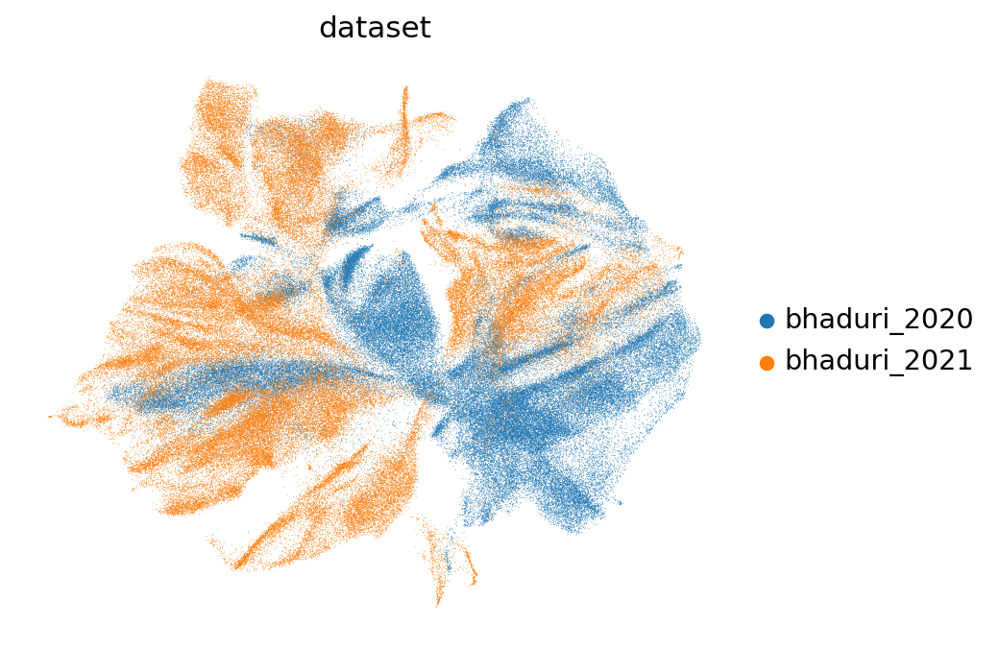

In [31]:
sc.pl.umap(adata, color='dataset', frameon=False, save='_dataset.png', show=True)

### Finding from 9a — UMAP by dataset, partial integration (mixed verdict)

**What's there:**
- Substantial intermixing in the central body — interleaved blue/orange dots, no stripes.
- Dataset-skewed regions: right-side blue-dominant (2020), bottom-left orange-dominant (2021), small isolated blue islands at the top edge.
- No catastrophic two-stripe failure pattern.

Dataset-skewed regions could be either expected biology (organoid-only stress/choroid; fetal-only microglia/OPCs/vascular) or under-correction. The disambiguation comes from 9b + 9c + 9d together — 9a alone cannot conclude success or failure.

### 9b — UMAP colored by Leiden cluster

Cluster geography. We assign cell types in colab_09 (next notebook).

/tmp/ipykernel_20795/2406160928.py:1: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.umap(adata, color='leiden', legend_loc='on data', frameon=False, save='_leiden.png', show=True)


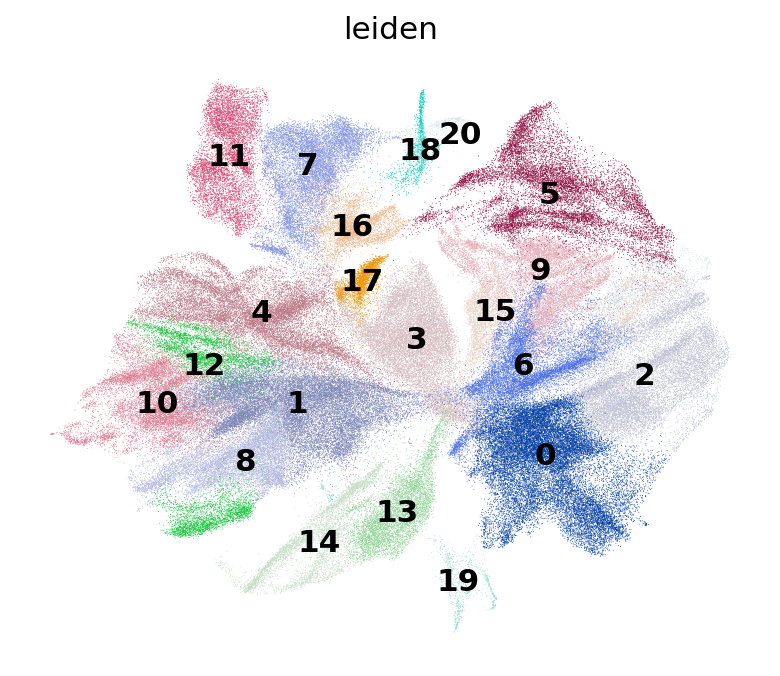

In [32]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', frameon=False, save='_leiden.png', show=True)

### Finding from 9b — clusters trace a continuous developmental topology

21 clusters arranged in one large connected mass with peripheral lobes — biologically coherent (continuous developmental trajectories, not discrete categorical types).

**Central clusters** (1, 3, 5, 6, 15, 16, 17): progenitor-dense region. **Peripheral lobes** (0, 2 right; 8, 10, 12 bottom-left; 14, 19 bottom): more committed or dataset-specific populations. **Top-edge small clusters** (18, 20): rare or off-target populations.

Cluster IDs are placeholders only — biological annotation comes in colab_09 (next session).

### 9c — Lineage marker genes

Sanity-check that markers land in expected regions:
- **SOX2**, **PAX6** — radial glia
- **EOMES** — intermediate progenitors
- **TBR1**, **NEUROD2** — excitatory neurons
- **GAD1**, **GAD2** — GABAergic interneurons
- **GFAP** — astrocytes
- **MKI67** — cycling cells

Scattered/diffuse markers → over-integration. `use_raw=True` reads from the full 16,768-gene `.raw` matrix, not the 2,000-HVG `.X`.

/tmp/ipykernel_20795/1936518233.py:6: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.umap(adata, color=present, use_raw=True, ncols=3, frameon=False, save='_markers.png', show=True)


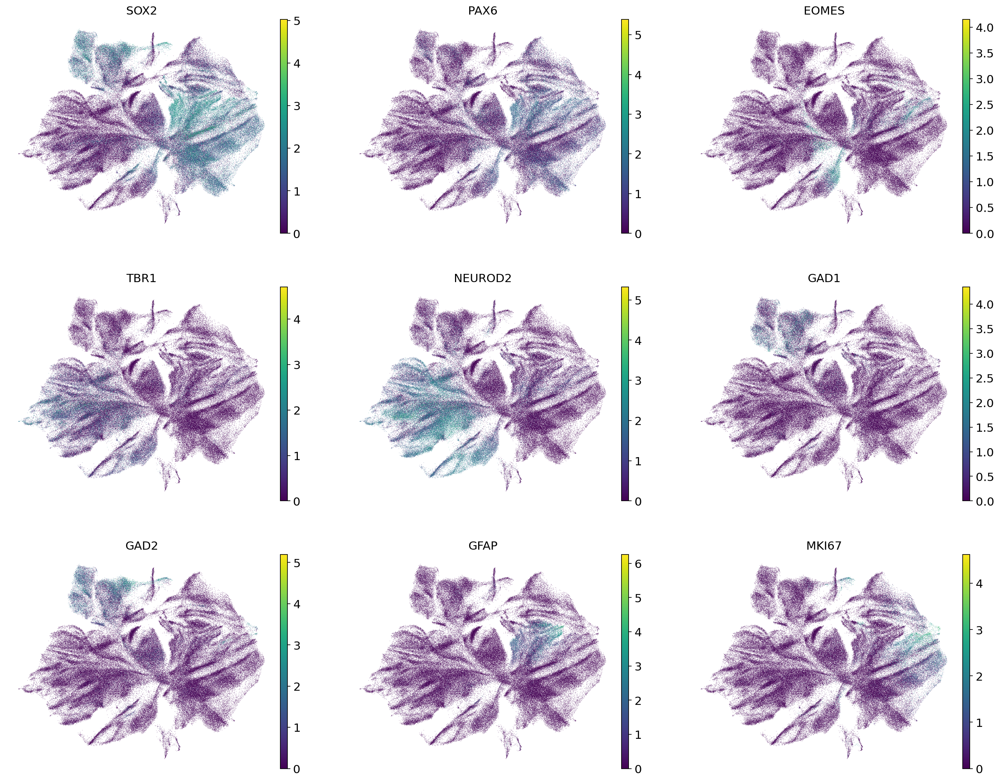

In [34]:
markers = ['SOX2', 'PAX6', 'EOMES', 'TBR1', 'NEUROD2', 'GAD1', 'GAD2', 'GFAP', 'MKI67']
present = [g for g in markers if g in adata.raw.var_names]
missing = [g for g in markers if g not in adata.raw.var_names]
if missing:
    print(f'Markers missing from .raw: {missing}')
sc.pl.umap(adata, color=present, use_raw=True, ncols=3, frameon=False, save='_markers.png', show=True)

### Finding from 9c (combined grid) — markers visibly localize, but grid resolution is insufficient for precise reads

Initial thumbnail-only interpretation was wrong (placed SOX2/PAX6 overlap in top-left when it was actually on the right). This failure mode flagged the need for the per-marker individual full-size plots in the next cell — now a project-wide standard for any multi-panel plot (memory: `feedback_plots_individual.md`).

/tmp/ipykernel_20795/3436341254.py:3: FutureWarning: Argument `save` is deprecated and will be removed in a future version. Use `sc.pl.plot(show=False).figure.savefig()` instead.
  sc.pl.umap(adata, color=gene, use_raw=True, frameon=False, size=8,


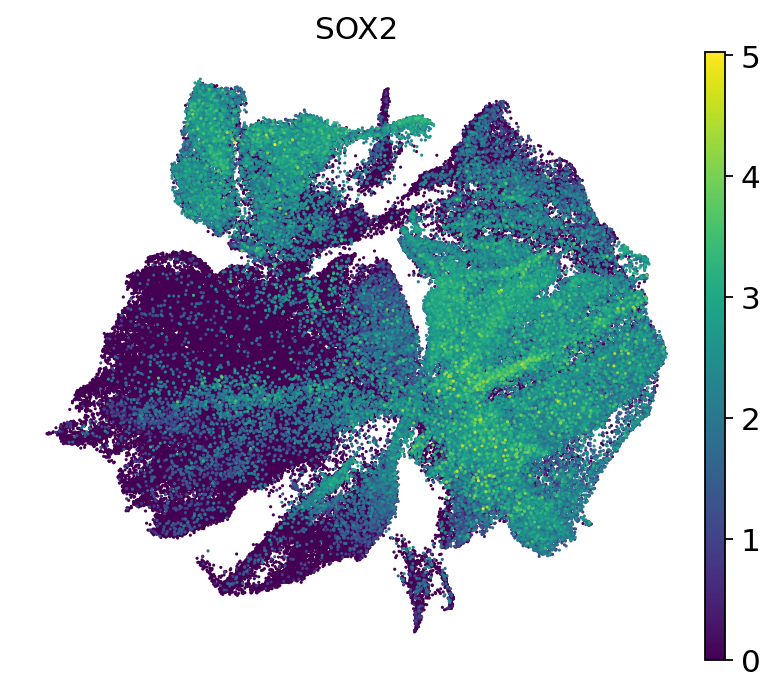

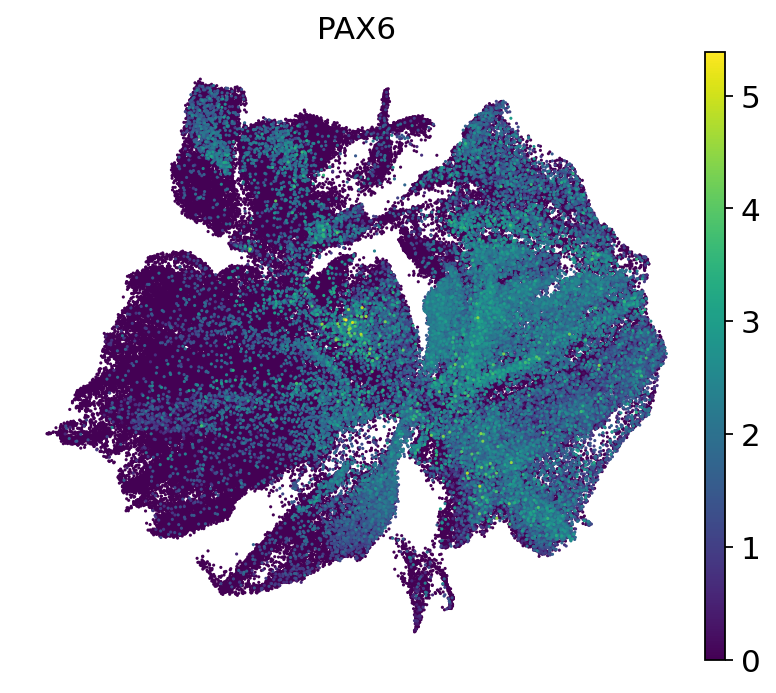

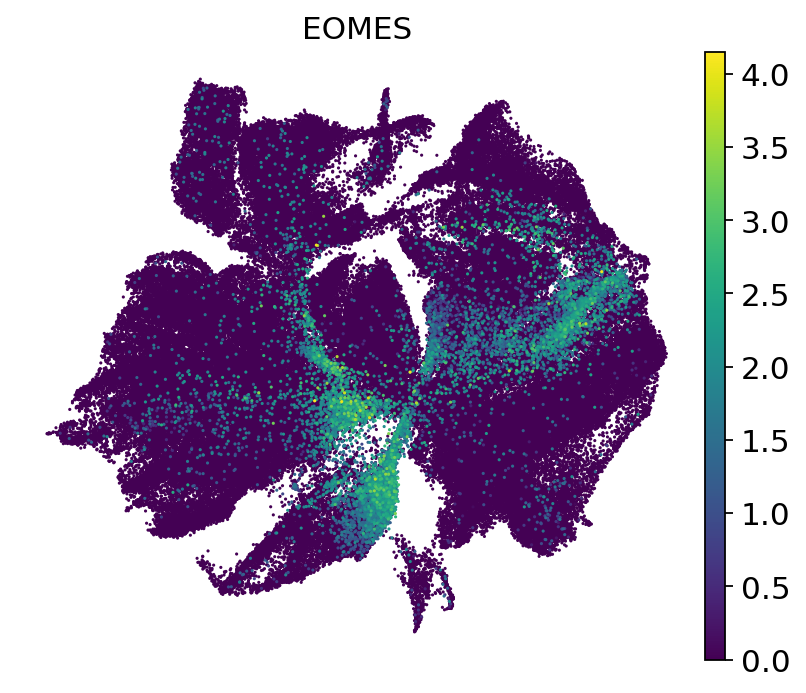

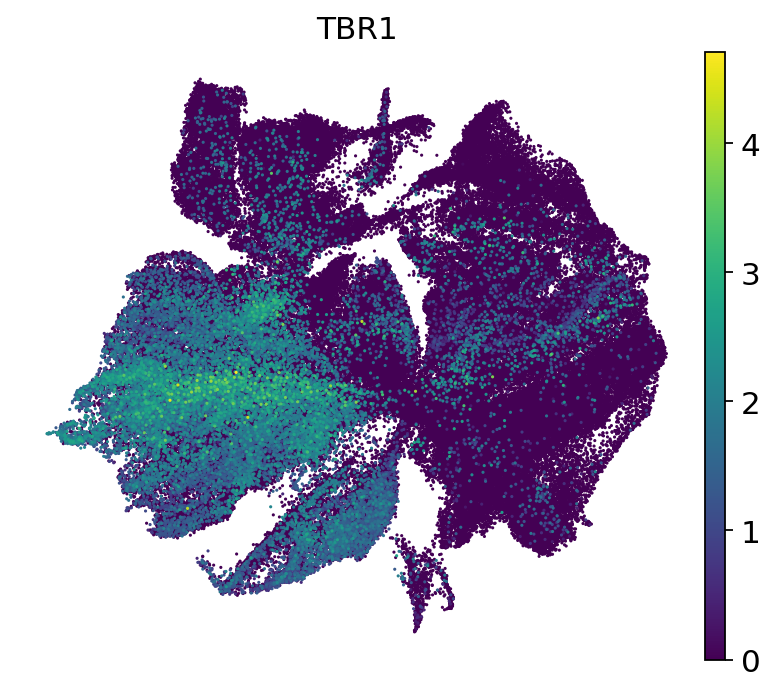

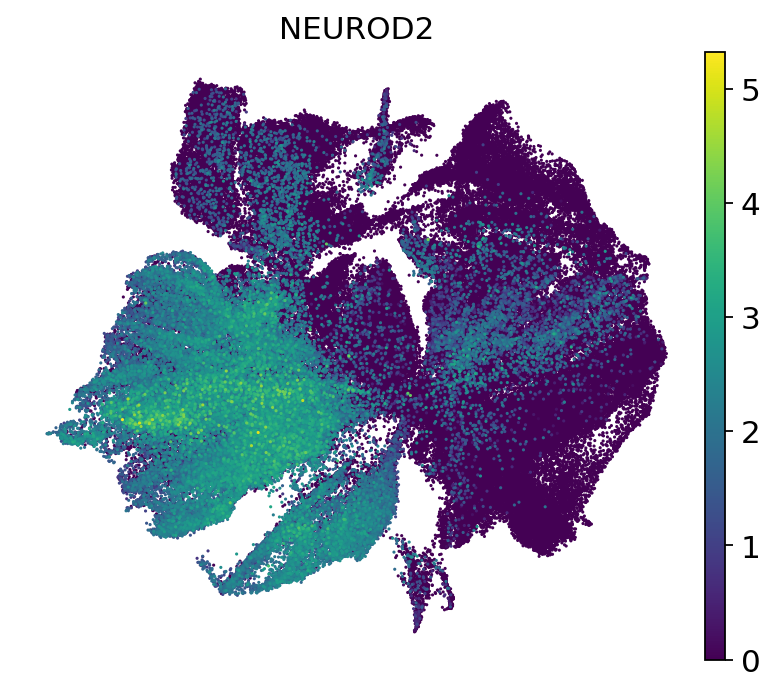

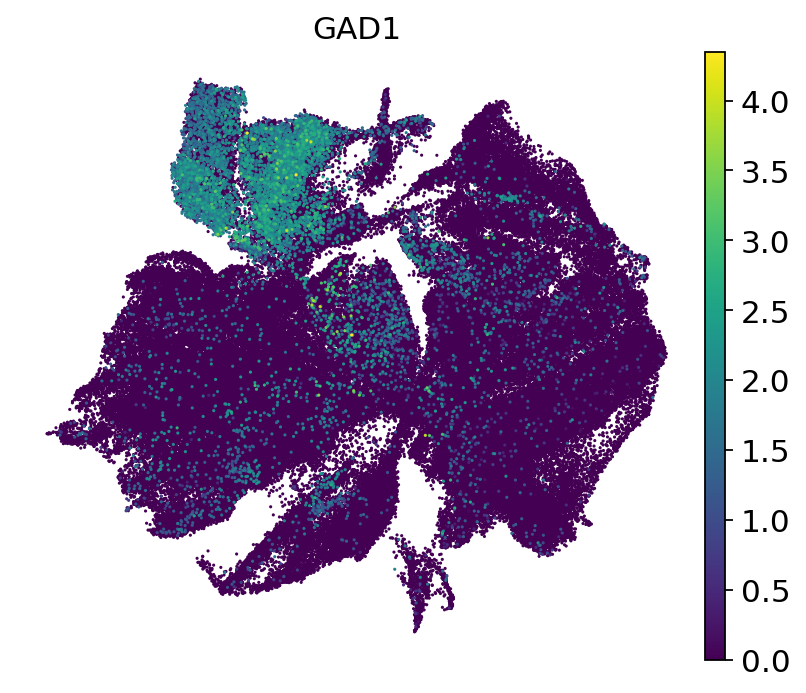

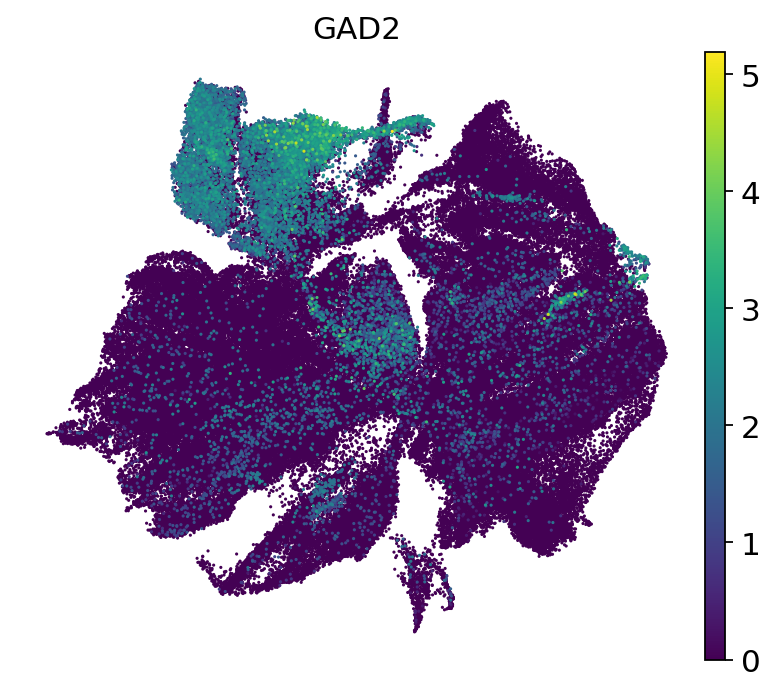

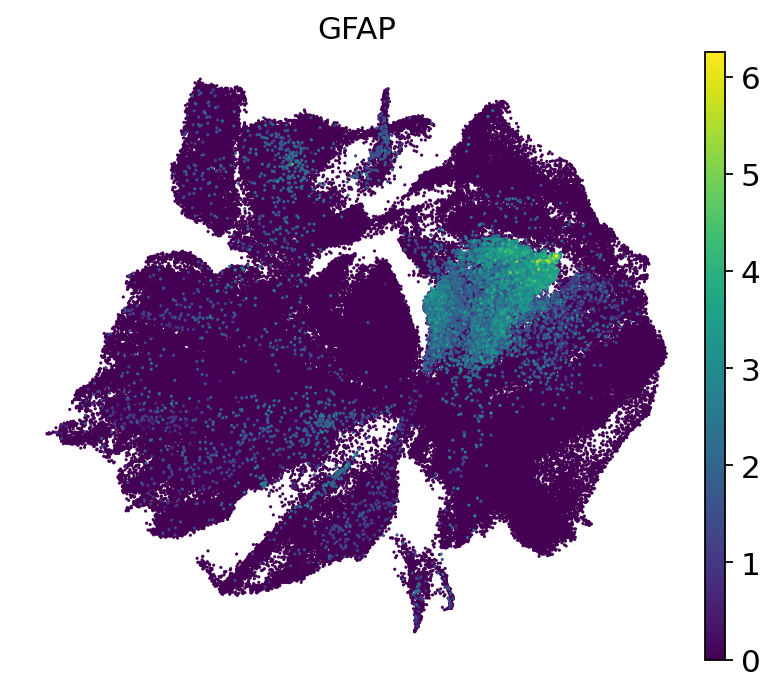

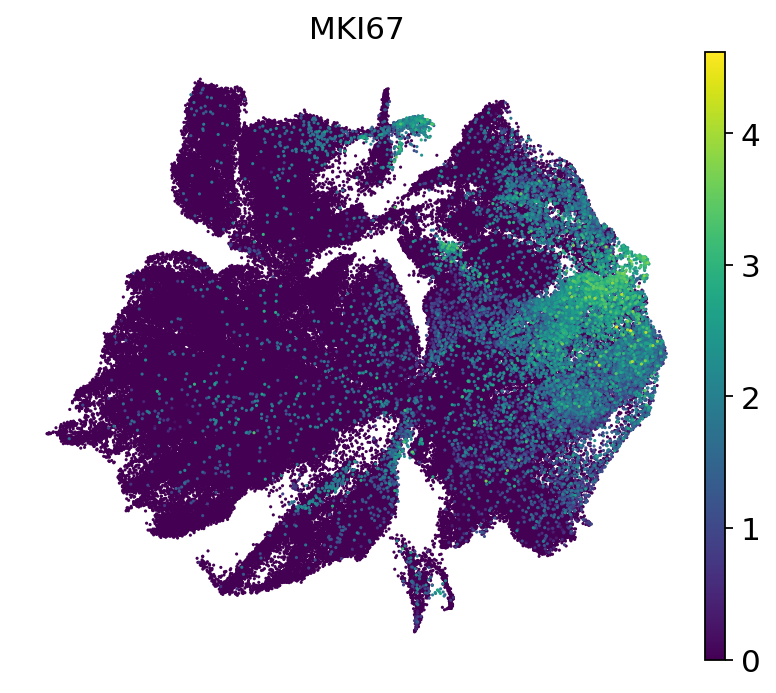

In [35]:
# individual full-size per marker (new — for accurate per-gene reads)
for gene in present:
    sc.pl.umap(adata, color=gene, use_raw=True, frameon=False, size=8,
                save=f'_marker_{gene}.png', show=True)

### Finding from 9c (individual marker plots) — clean dorsal-ventral progenitor split recovered

Per-marker plots reveal the developmental geography clearly:

| Region | Markers present | Cell identity |
|---|---|---|
| **Right** | PAX6 + SOX2 + MKI67 + EOMES (patch) | Cortical radial glia, actively cycling, with intermediate progenitors |
| **Top-left** | SOX2 + GAD1 + GAD2 (PAX6 absent/low) | Subpallial / GE-like progenitors and GABAergic interneurons (SOX2⁺ PAX6⁻ = ventral signature) |
| **Bottom-left** | TBR1 + NEUROD2 | Mature excitatory cortical neurons |
| **Central** | EOMES + some MKI67 | IPC transition zone bridging cortical progenitors → neurons |

The classic cortical lineage (PAX6 → EOMES → TBR1) traces a path on the UMAP: **right → center → bottom-left**. The subpallial GE → interneuron lineage forms a separate lineage in the top-left.

Recovering this dorsal-ventral split independently of cluster annotation is a strong signal that integration preserved real biological structure. **However, the quantitative read in 9d shows where this preservation is incomplete.**

### 9d — Cluster × dataset composition

Percentage of each dataset within each Leiden cluster. Values near 50/50 mean Harmony mixed that cluster well; clusters > 95% one dataset are candidates for batch artifacts — unlike the colab_03 Zhong run, both Bhaduri datasets should largely overlap, so heavily skewed clusters here would be more concerning than in colab_03.

In [36]:
comp = pd.crosstab(adata.obs['leiden'], adata.obs['dataset'], normalize='index') * 100
comp = comp.round(1)
comp['total_cells'] = adata.obs['leiden'].value_counts().sort_index().values
print(comp)

dataset  bhaduri_2020  bhaduri_2021  total_cells
leiden                                          
0                98.7           1.3        23737
1                51.2          48.8        21713
2                83.1          16.9        16103
3                98.2           1.8        15524
4                15.0          85.0        15452
5                89.2          10.8        13270
6                72.8          27.2        11930
7                14.9          85.1        11454
8                 5.1          94.9        10262
9                19.2          80.8        10051
10               36.1          63.9         9733
11                1.6          98.4         7228
12                1.4          98.6         6877
13                3.6          96.4         6413
14                0.4          99.6         4940
15                1.8          98.2         4902
16               63.6          36.4         4412
17               98.1           1.9         2690
18                1.

### Finding from 9d — composition table reveals concerning residual batch axis

**Three regimes:**
- **Healthy mixing** (3 clusters, 39,156 cells): cluster 1 (51/49), 10 (36/64), 16 (64/36).
- **2020-pure (>95%)** (3 clusters, 41,951 cells): 0 (98.7%, 23,737 cells), 3 (98.2%), 17 (98.1%).
- **2021-pure (>95%)** (7 clusters, 41,950 cells): 8 (94.9%), 11 (98.4%), 12 (98.6%), 13 (96.4%), 14 (99.6%), 15 (98.2%), 18 (98.8%).
- Moderately skewed (70–90%): 2, 4, 5, 6, 7, 9, 19, 20.

**Quantitative concern:** ca. 41% of cells in each dataset live in >95%-pure clusters. Biology-only ceiling is ca. 10–15% (2021's microglia ~2.5%, OPCs ~1.8%, vascular ~0.8%, mature astrocytes; 2020's choroid plexus, stress, dying cells from Session 11). The observed 41% is far above what biology alone explains.

**Biggest red flag — cluster 0**: 23,737 cells (24% of all 2020 cells) at 98.7% organoid-pure, sitting in the cortical RG zone (per 9c — right-side region with PAX6 + SOX2 + MKI67). Bhaduri 2021 is 9.8% RG in `cell_type_coarse` (~9,800 fetal RG cells); they should partially populate this cluster but don't.

**Verdict deferred to colab_09 annotation:**
- If cluster 0 = vRG / cortical RG (shared cell type) → Harmony under-corrected; consider re-integration with intersection-only HVGs (drop from 2,000 to the 751 HV-in-both subset), increase Harmony `theta`, or switch to scVI.
- If cluster 0 = choroid plexus or stress (organoid-only biology) → 41% is mostly real biology; proceed with caveats.

**Diagnostic gain over colab_03**: at 100× imbalance every Zhong-dominant cluster would have been 99%+ Zhong by sheer numbers; we couldn't have detected this. The 1:1 balance is exposing what Harmony actually achieved.

## 10. Save integrated object

### 10a — Write `integrated_100k_harmony.h5ad` to Drive

Keeps `.raw` (full log-normalized 16,768-gene matrix), `.X` (scaled HVGs), `.obsm['X_pca']` / `X_pca_harmony` / `X_umap`, neighbor graph, and Leiden labels. Predicted size: ca. 6–7 GB (extrapolated from colab_03's 226k → 7.5 GB at the same HVG/PC settings).

In [37]:
adata.write_h5ad(PATHS['integrated_out'])
size_gb = os.path.getsize(PATHS['integrated_out']) / 1e9
print(f'Saved: {PATHS["integrated_out"]}')
print(f'Size:  {size_gb:.2f} GB')
print(f'Final shape: {adata.shape}')

Saved: /content/drive/MyDrive/brain-organoid-trajectories/data/processed/integrated/integrated_100k_harmony.h5ad
Size:  5.54 GB
Final shape: (200000, 2000)


### Finding from 10a — saved, under predicted size

Path: `data/processed/integrated/integrated_100k_harmony.h5ad`. **Size: 5.54 GB** (predicted ca. 6–7 GB based on colab_03's 226k → 7.5 GB scaling; came in below). Final shape: (200000, 2000) — `.X` is HVG-subsetted scaled, `.raw` carries the full 16,768-gene log-normalized matrix.